# NEWS CATEGORY CLASSIFICATION

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from wordcloud import STOPWORDS
import random
import nltk
import re
from string import punctuation
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from textblob import TextBlob
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.pipeline import Pipeline
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

## Import libraries

# Data Exploration


In [5]:
df = pd.read_csv("News_Categories123.csv")

## Understanding features and target variables

In [6]:
df.head(-1)

,Unnamed: 0,category,headline,authors,link,short_description,date
0,0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,26-05-2018
1,1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,26-05-2018
2,2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,26-05-2018
3,3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,26-05-2018
4,4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",26-05-2018
...,...,...,...,...,...,...,...
200847,200847,TECH,Watch The Top 9 YouTube Videos Of The Week,Catharine Smith,https://www.huffingtonpost.com/entry/watch-top...,If you're looking to see the most popular YouT...,28-01-2012
200848,200848,TECH,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,"Reuters, Reuters",https://www.huffingtonpost.com/entry/rim-ceo-t...,Verizon Wireless and AT&T are already promotin...,28-01-2012
200849,200849,SPORTS,Maria Sharapova Stunned By Victoria Azarenka I...,NaN,https://www.huffingtonpost.com/entry/maria-sha...,"Afterward, Azarenka, more effusive with the pr...",28-01-2012
200850,200850,SPORTS,"Giants Over Patriots, Jets Over Colts Among M...",NaN,https://www.huffingtonpost.com/entry/super-bow...,"Leading up to Super Bowl XLVI, the most talked...",28-01-2012


In [7]:
pd.unique(df['category'])

array(['CRIME', 'ENTERTAINMENT', 'WORLD NEWS', 'IMPACT', 'POLITICS',
       'WEIRD NEWS', 'BLACK VOICES', 'WOMEN', 'COMEDY', 'QUEER VOICES',
       'SPORTS', 'BUSINESS', 'TRAVEL', 'MEDIA', 'TECH', 'RELIGION',
       'SCIENCE', 'LATINO VOICES', 'EDUCATION', 'COLLEGE', 'PARENTS',
       'ARTS & CULTURE', 'STYLE', 'GREEN', 'TASTE', 'HEALTHY LIVING',
       'THE WORLDPOST', 'GOOD NEWS', 'WORLDPOST', 'FIFTY', 'ARTS',
       'WELLNESS', 'PARENTING', 'HOME & LIVING', 'STYLE & BEAUTY',
       'DIVORCE', 'WEDDINGS', 'FOOD & DRINK', 'MONEY', 'ENVIRONMENT',
       'CULTURE & ARTS'], dtype=object)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200853 entries, 0 to 200852
Data columns (total 7 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   Unnamed: 0         200853 non-null  int64 
 1   category           200853 non-null  object
 2   headline           200847 non-null  object
 3   authors            164233 non-null  object
 4   link               200853 non-null  object
 5   short_description  181141 non-null  object
 6   date               200853 non-null  object
dtypes: int64(1), object(6)
memory usage: 10.7+ MB


In [9]:
df.isna().sum()

Unnamed: 0               0
category                 0
headline                 6
authors              36620
link                     0
short_description    19712
date                     0
dtype: int64

In [10]:
df['category'].value_counts()

category
POLITICS          32739
WELLNESS          17827
ENTERTAINMENT     16058
TRAVEL             9887
STYLE & BEAUTY     9649
PARENTING          8677
HEALTHY LIVING     6694
QUEER VOICES       6314
FOOD & DRINK       6226
BUSINESS           5937
COMEDY             5175
SPORTS             4884
BLACK VOICES       4528
HOME & LIVING      4195
PARENTS            3955
THE WORLDPOST      3664
WEDDINGS           3651
WOMEN              3490
IMPACT             3459
DIVORCE            3426
CRIME              3405
MEDIA              2815
WEIRD NEWS         2670
GREEN              2622
WORLDPOST          2579
RELIGION           2556
STYLE              2254
SCIENCE            2178
WORLD NEWS         2177
TASTE              2096
TECH               2082
MONEY              1707
ARTS               1509
FIFTY              1401
GOOD NEWS          1398
ARTS & CULTURE     1339
ENVIRONMENT        1323
COLLEGE            1144
LATINO VOICES      1129
CULTURE & ARTS     1030
EDUCATION          1004
Name: c

In [11]:
df

,Unnamed: 0,category,headline,authors,link,short_description,date
0,0,CRIME,There Were 2 Mass Shootings In Texas Last Week...,Melissa Jeltsen,https://www.huffingtonpost.com/entry/texas-ama...,She left her husband. He killed their children...,26-05-2018
1,1,ENTERTAINMENT,Will Smith Joins Diplo And Nicky Jam For The 2...,Andy McDonald,https://www.huffingtonpost.com/entry/will-smit...,Of course it has a song.,26-05-2018
2,2,ENTERTAINMENT,Hugh Grant Marries For The First Time At Age 57,Ron Dicker,https://www.huffingtonpost.com/entry/hugh-gran...,The actor and his longtime girlfriend Anna Ebe...,26-05-2018
3,3,ENTERTAINMENT,Jim Carrey Blasts 'Castrato' Adam Schiff And D...,Ron Dicker,https://www.huffingtonpost.com/entry/jim-carre...,The actor gives Dems an ass-kicking for not fi...,26-05-2018
4,4,ENTERTAINMENT,Julianna Margulies Uses Donald Trump Poop Bags...,Ron Dicker,https://www.huffingtonpost.com/entry/julianna-...,"The ""Dietland"" actress said using the bags is ...",26-05-2018
...,...,...,...,...,...,...,...
200848,200848,TECH,RIM CEO Thorsten Heins' 'Significant' Plans Fo...,"Reuters, Reuters",https://www.huffingtonpost.com/entry/rim-ceo-t...,Verizon Wireless and AT&T are already promotin...,28-01-2012
200849,200849,SPORTS,Maria Sharapova Stunned By Victoria Azarenka I...,NaN,https://www.huffingtonpost.com/entry/maria-sha...,"Afterward, Azarenka, more effusive with the pr...",28-01-2012
200850,200850,SPORTS,"Giants Over Patriots, Jets Over Colts Among M...",NaN,https://www.huffingtonpost.com/entry/super-bow...,"Leading up to Super Bowl XLVI, the most talked...",28-01-2012
200851,200851,SPORTS,Aldon Smith Arrested: 49ers Linebacker Busted ...,NaN,https://www.huffingtonpost.com/entry/aldon-smi...,CORRECTION: An earlier version of this story i...,28-01-2012


# Visualisation and plotting the data

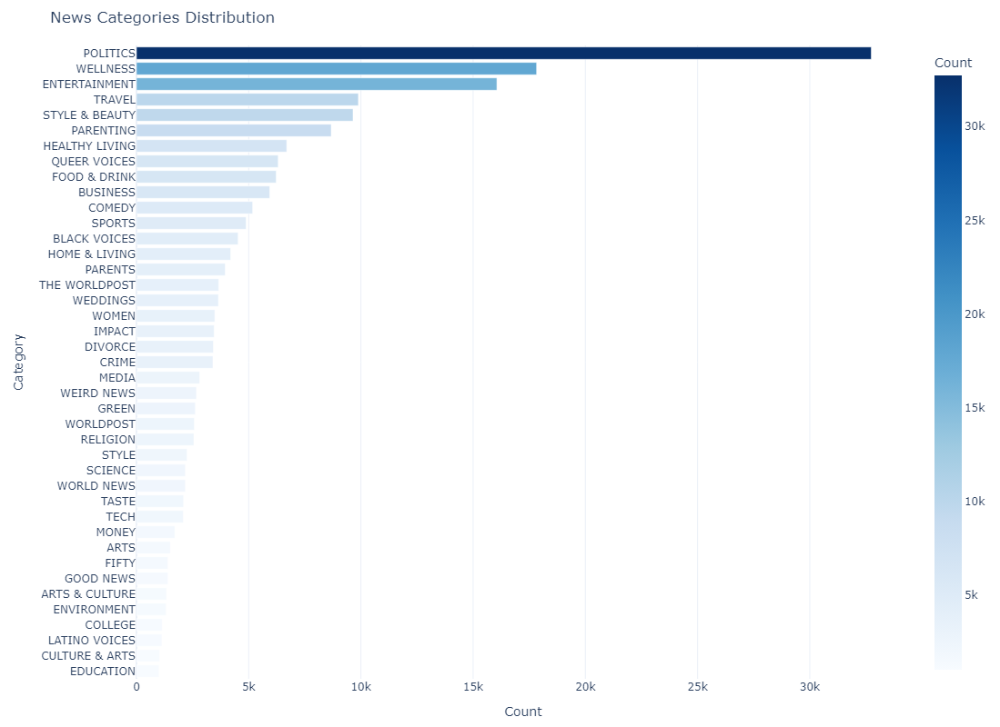

In [12]:
category_counts = df['category'].value_counts().reset_index()
category_counts.columns = ['Category', 'Count']

# Sorting in ascending order
category_counts = category_counts.sort_values(by='Count', ascending=True)

# creates the plot
fig = px.bar(
    category_counts,
    x='Count',
    y='Category',
    orientation='h',
    title='News Categories Distribution',
    color='Count',
    color_continuous_scale='blues',
)

# layout theme and labelling
fig.update_layout(
    template='plotly_white',
    xaxis_title='Count',
    yaxis_title='Category',
    coloraxis_colorbar=dict(title='Count'),
)

# adjusting scale of the y-axis
fig.update_yaxes(categoryorder='total ascending', tickmode='linear', tick0=0, dtick=1)

# adjust figure size and margins
fig.update_layout(height=800, margin=dict(l=150, r=20, t=50, b=50))

# display the plot
fig.show()

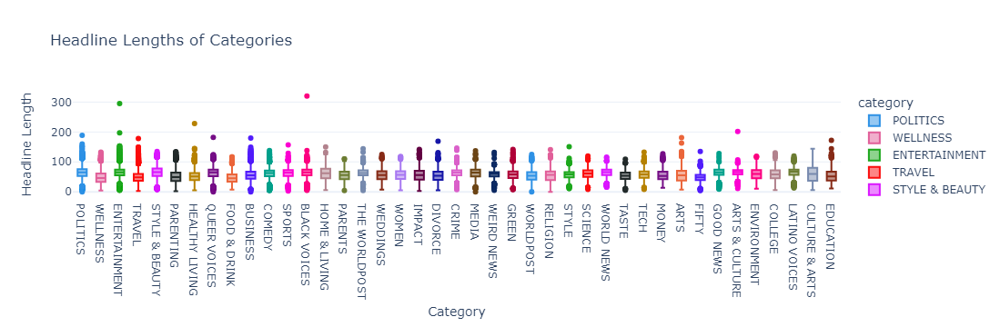

In [13]:
#Converting each empty spaces in Headline into a string & calculating the string length.
df['headline'] = df['headline'].fillna('')
df['headline_length'] = df['headline'].astype(str).apply(len)
# Create an interactive box plot with dark theme
fig = px.box(
    df,
    x='category',
    y='headline_length',
    color='category',
    category_orders={'category': df['category'].value_counts().index},
    title='Headline Lengths of Categories',
    labels={'headline_length': 'Headline Length'},
    color_discrete_sequence=px.colors.qualitative.Dark24,
)

# Customize the layout for dark theme
fig.update_layout(template='plotly_white', xaxis_title='Category', yaxis_title='Headline Length',)

# Show the plot
fig.show()

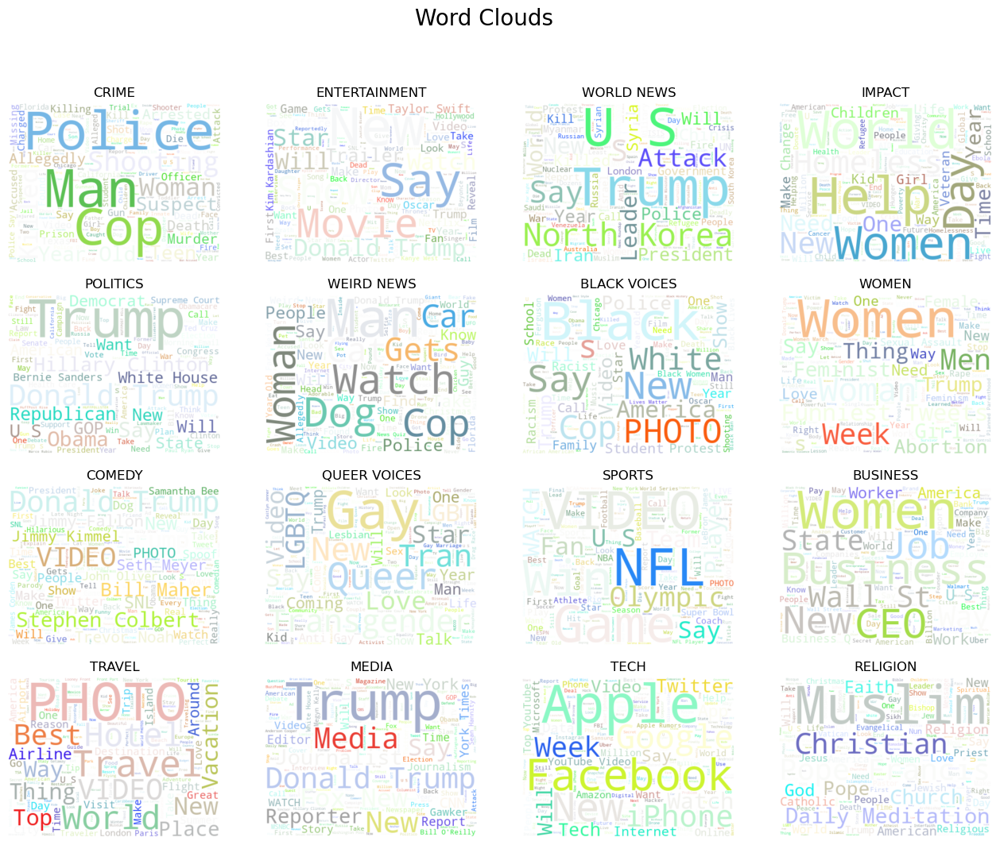

In [14]:
def random_color_func(word=None, font_size=None, position=None, orientation=None, font_path=None, random_state=None):
    h = int(250.0 * random.random())
    s = int(100.0 * random.random())
    l = int(50.0 * random.random()) + 50
    return "hsl({}, {}%, {}%)".format(h, s, l)

# background
plt.style.use('default')

# word cloud for each category
fig, axes = plt.subplots(4, 4, figsize=(16, 12), subplot_kw=dict(xticks=[], yticks=[], frame_on=False))
for ax, category in zip(axes.flatten(), df['category'].unique()):
    wordcloud = WordCloud(width=400, height=300, random_state=42, max_font_size=100, background_color='white',
                          color_func=random_color_func, stopwords=STOPWORDS).generate(' '.join(df[df['category']==category]['headline']))
    ax.imshow(wordcloud, interpolation="bilinear")
# category names to be displayed in black color.
    ax.set_title(category, color='black')
 # suptitle
plt.suptitle('Word Clouds', fontsize=20, color='black')
# display
plt.show()

# Data Cleaning

In [15]:
#descriptive statitics of the numeric data.
df.describe()

,Unnamed: 0,headline_length
count,200853.000000,200853.000000
mean,100426.000000,57.940240
std,57981.411146,18.914003
min,0.000000,0.000000
25%,50213.000000,45.000000
50%,100426.000000,59.000000
75%,150639.000000,71.000000
max,200852.000000,320.000000


In [16]:
#displays the empty lines in the [headline] column
df.loc[df["headline"] == ""]

,Unnamed: 0,category,headline,authors,link,short_description,date,headline_length
82270,82270,POLITICS,,"Robert Moran, ContributorRobert Moran leads Br...",https://www.huffingtonpost.com/entry/lincoln-2...,NaN,22-08-2015,0
86893,86893,RELIGION,,"Matthew Fox, ContributorRadical theologian Mat...",https://www.huffingtonpost.com/entry/post_9671...,Let everyone not wrapped in tired and disprove...,30-06-2015,0
95001,95001,WORLDPOST,,"Natasha Srdoc, ContributorAuthor, Economist, C...",https://www.huffingtonpost.com/entry/us-and-eu...,NaN,29-03-2015,0
100426,100426,BUSINESS,,"Gary Snyder, ContributorWriter and Media Strat...",https://www.huffingtonpost.com/entry/disney-ce...,NaN,25-01-2015,0
101479,101479,MEDIA,,"Gary Snyder, ContributorWriter and Media Strat...",https://www.huffingtonpost.com/entry/beverly-h...,NaN,13-01-2015,0
113471,113471,QUEER VOICES,,"Gary Snyder, ContributorWriter and Media Strat...",https://www.huffingtonpost.com/entry/beverly-h...,NaN,28-08-2014,0


In [17]:
#displays the null lines in the [short_description] column
df.loc[df["short_description"].isna()]

,Unnamed: 0,category,headline,authors,link,short_description,date,headline_length
12099,12099,COMEDY,The Big Blue Wave,"Shan Wells, ContributorSciency sun venerator +...",https://www.huffingtonpost.com/entry/the-big-b...,NaN,10-11-2017,17
12849,12849,WORLD NEWS,"Inside Rukban Camp, One Of Syria’s Most Desper...","Yasser Allawi, Syria Deeply",https://www.huffingtonpost.com/entry/inside-ru...,NaN,31-10-2017,61
14119,14119,WORLD NEWS,Syrian Refugees Return From Lebanon Only To Fl...,"Abby Sewell, Refugees Deeply",https://www.huffingtonpost.com/entry/syrian-re...,NaN,14-10-2017,62
23549,23549,TASTE,Your Guide To The Best BBQ In St. Louis Accord...,NaN,https://www.huffingtonpost.com/entry/your-guid...,NaN,19-06-2017,58
25814,25814,COMEDY,The Bechdel Test,"Hilary Fitzgerald Campbell, ContributorHilary'...",https://www.huffingtonpost.com/entry/the-bechd...,NaN,24-05-2017,16
...,...,...,...,...,...,...,...,...
198250,198250,QUEER VOICES,True LGBTQ Stories: When A College Football Te...,"Nathan Manske, Contributor\nExecutive Director...",https://www.huffingtonpost.com/entry/true-lgbt...,NaN,25-02-2012,81
198265,198265,ENVIRONMENT,'Chasing Ice' -- The Climate Change Debate Is ...,"Greg Reitman, Contributor\nFounder of Blue Wat...",https://www.huffingtonpost.com/entry/chasing-i...,NaN,25-02-2012,50
200129,200129,IMPACT,Practice for International Kissing Day: 'Love ...,"Karen Dalton-Beninato, Contributor\nWriter Nea...",https://www.huffingtonpost.com/entry/love-is-l...,NaN,05-02-2012,54
200191,200191,QUEER VOICES,"Zach Huston, Victim of Brutal Ohio School Bull...","Ian Thompson, Contributor\nLegislative Represe...",https://www.huffingtonpost.com/entry/zach-hust...,NaN,04-02-2012,75


In [18]:
#Function to remove empty row
def removeEmptyLine(df,col_name):
    df.replace("", pd.NA, inplace = True)
    df.dropna(subset=[col_name], inplace=True)
    return df

In [19]:
df = removeEmptyLine(df,"headline")
df = removeEmptyLine(df,"short_description")
df = removeEmptyLine(df,"authors")

In [20]:
#ensuring that empty lines were removed successfully
print((df["headline"] == "").sum())
print((df["short_description"].isna().sum()))
print((df["authors"] == "").sum())

0
0
0


In [21]:
#double checking if there is any null values 
df.loc[df["short_description"].isna()]

,Unnamed: 0,category,headline,authors,link,short_description,date,headline_length


In [22]:
df.isna().sum()

Unnamed: 0           0
category             0
headline             0
authors              0
link                 0
short_description    0
date                 0
headline_length      0
dtype: int64

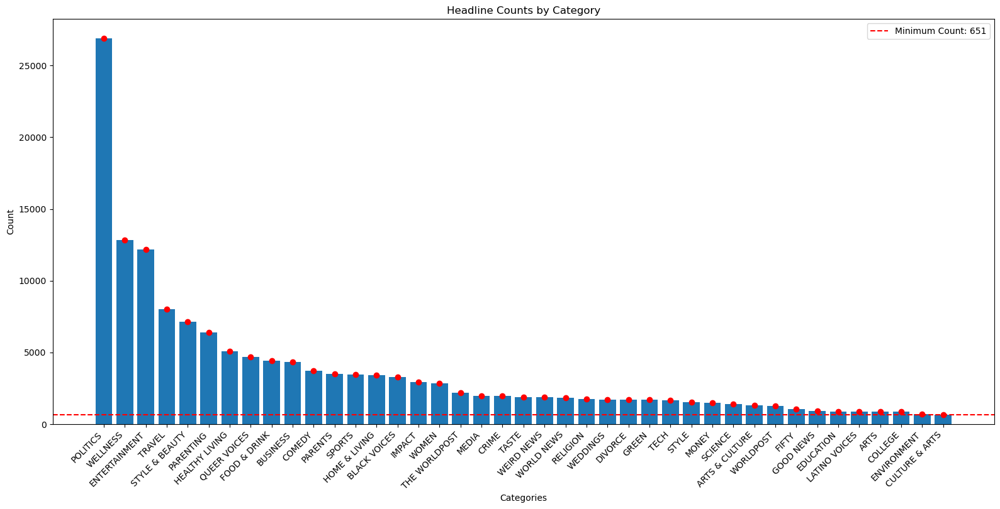

In [23]:
#as we know the dataset is highly imbalanced we are going to perform down sampling and we are only going to consider categories with more data.
# Grouping by category and counting headlines, then sorting by count in descending order
count_df = pd.DataFrame(df.groupby(["category"]).count()["headline"].sort_values(ascending=False), columns=["headline"])

# Find the minimum headline count for a category
min_count = df.groupby(["category"]).count()["headline"].min()

# Plotting
plt.figure(figsize=(16, 8))  # Adjusted figure size for better readability
plt.xlabel("Categories")
plt.ylabel("Count")
plt.bar(count_df.index, count_df["headline"])  # Using blue bars for the bar plot
plt.plot(count_df.index, count_df["headline"], 'ro')  # Marking data points with red dots

# Adding a horizontal line for the minimum count
plt.axhline(y=min_count, color='red', linestyle='--', label=f'Minimum Count: {min_count}')

plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent overlapping labels
plt.legend()  # Show legend with minimum count
plt.title("Headline Counts by Category")
plt.show()

In [24]:
#get the category with number of news more than 3000
category_list = count_df.loc[count_df["headline"] >= 3000].index.to_list()
category_list

['POLITICS',
 'WELLNESS',
 'ENTERTAINMENT',
 'TRAVEL',
 'STYLE & BEAUTY',
 'PARENTING',
 'HEALTHY LIVING',
 'QUEER VOICES',
 'FOOD & DRINK',
 'BUSINESS',
 'COMEDY',
 'PARENTS',
 'SPORTS',
 'HOME & LIVING',
 'BLACK VOICES']

### For the classification, we will just use 500 news per category because it requires high computational power to run it.

In [25]:
#creating an empty list
my_list = []
#function to concatenate headline and short description, limiting the data with only 500 data from each selected category.
for cat in category_list:
    my_list.append(df.loc[df["category"] == cat,['headline','category','short_description']].head(500))
df = pd.concat(my_list, ignore_index=True)
df["News"] = df["headline"] +' '+ df["short_description"]
df

,headline,category,short_description,News
0,Trump's Crackdown On Immigrant Parents Puts Mo...,POLITICS,Last month a Health and Human Services officia...,Trump's Crackdown On Immigrant Parents Puts Mo...
1,'Trump's Son Should Be Concerned': FBI Obtaine...,POLITICS,The wiretaps feature conversations between Ale...,'Trump's Son Should Be Concerned': FBI Obtaine...
2,Edward Snowden: There's No One Trump Loves Mor...,POLITICS,"But don't count on Robert Mueller to nail him,...",Edward Snowden: There's No One Trump Loves Mor...
3,Booyah: Obama Photographer Hilariously Trolls ...,POLITICS,Just a peeping minute.,Booyah: Obama Photographer Hilariously Trolls ...
4,Ireland Votes To Repeal Abortion Amendment In ...,POLITICS,Irish women will no longer have to travel to t...,Ireland Votes To Repeal Abortion Amendment In ...
...,...,...,...,...
7495,"Natasha Rothwell On 'Insecure,' Representation...",BLACK VOICES,The comedian discusses how she uses her passio...,"Natasha Rothwell On 'Insecure,' Representation..."
7496,Students Punished For Wearing Confederate Flag...,BLACK VOICES,They wore them in response to black students p...,Students Punished For Wearing Confederate Flag...
7497,There Is No Debate: The Tyranny Of The Mobiliz...,BLACK VOICES,Recent outrage expressed toward Ta-Nehisi Coat...,There Is No Debate: The Tyranny Of The Mobiliz...
7498,Air Force Academy Says Offensive Graffiti Was ...,BLACK VOICES,"""You can never overemphasize the need for a cu...",Air Force Academy Says Offensive Graffiti Was ...


In [26]:
df['category'].value_counts()

category
POLITICS          500
WELLNESS          500
ENTERTAINMENT     500
TRAVEL            500
STYLE & BEAUTY    500
PARENTING         500
HEALTHY LIVING    500
QUEER VOICES      500
FOOD & DRINK      500
BUSINESS          500
COMEDY            500
PARENTS           500
SPORTS            500
HOME & LIVING     500
BLACK VOICES      500
Name: count, dtype: int64

In [27]:
# droping these categories as the dataframe already have similar categories.
df = df[df['category'] != 'PARENTS']
df = df[df['category'] != 'HOME & LIVING']

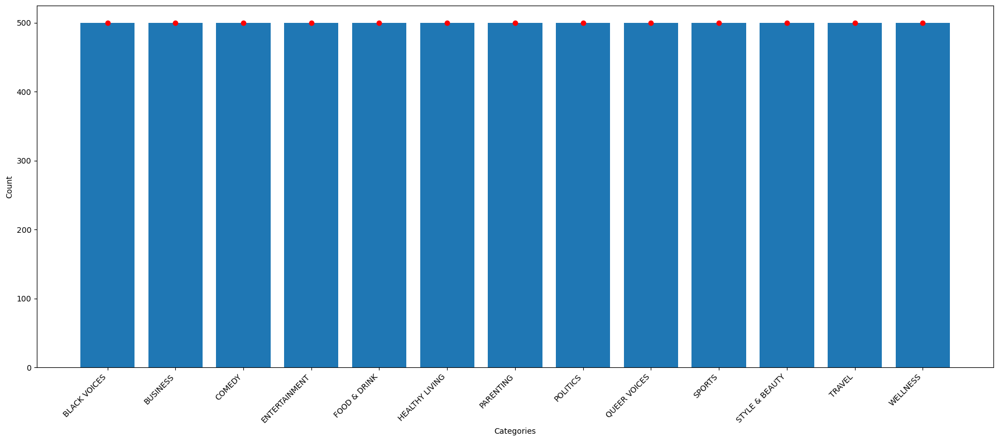

In [28]:
count_df = pd.DataFrame(df.groupby(["category"]).count()["News"].sort_values(ascending=False))

plt.figure(figsize=(18,8))
plt.xlabel("Categories")
plt.ylabel("Count")
plt.bar(count_df.index,count_df["News"])
plt.plot(count_df.index,count_df["News"],'ro')
plt.xticks(rotation=45, ha='right')  # Rotating x-axis labels for better readability
plt.tight_layout()  # Adjust layout to prevent overlapping labels

In [29]:
df

,headline,category,short_description,News
0,Trump's Crackdown On Immigrant Parents Puts Mo...,POLITICS,Last month a Health and Human Services officia...,Trump's Crackdown On Immigrant Parents Puts Mo...
1,'Trump's Son Should Be Concerned': FBI Obtaine...,POLITICS,The wiretaps feature conversations between Ale...,'Trump's Son Should Be Concerned': FBI Obtaine...
2,Edward Snowden: There's No One Trump Loves Mor...,POLITICS,"But don't count on Robert Mueller to nail him,...",Edward Snowden: There's No One Trump Loves Mor...
3,Booyah: Obama Photographer Hilariously Trolls ...,POLITICS,Just a peeping minute.,Booyah: Obama Photographer Hilariously Trolls ...
4,Ireland Votes To Repeal Abortion Amendment In ...,POLITICS,Irish women will no longer have to travel to t...,Ireland Votes To Repeal Abortion Amendment In ...
...,...,...,...,...
7495,"Natasha Rothwell On 'Insecure,' Representation...",BLACK VOICES,The comedian discusses how she uses her passio...,"Natasha Rothwell On 'Insecure,' Representation..."
7496,Students Punished For Wearing Confederate Flag...,BLACK VOICES,They wore them in response to black students p...,Students Punished For Wearing Confederate Flag...
7497,There Is No Debate: The Tyranny Of The Mobiliz...,BLACK VOICES,Recent outrage expressed toward Ta-Nehisi Coat...,There Is No Debate: The Tyranny Of The Mobiliz...
7498,Air Force Academy Says Offensive Graffiti Was ...,BLACK VOICES,"""You can never overemphasize the need for a cu...",Air Force Academy Says Offensive Graffiti Was ...


In [30]:
#function to drop any columns with empty spaces, underscores, or double underscores.
def removeEmptyRow(df,col_name):
    df.replace([" ","","_","__"], pd.NA, inplace = True)
    df.dropna(subset=[col_name], inplace=True)
    return df

In [31]:
#checking the merged dataframe News for empty row.
df = removeEmptyRow(df,"News")
df.head(-1)

,headline,category,short_description,News
0,Trump's Crackdown On Immigrant Parents Puts Mo...,POLITICS,Last month a Health and Human Services officia...,Trump's Crackdown On Immigrant Parents Puts Mo...
1,'Trump's Son Should Be Concerned': FBI Obtaine...,POLITICS,The wiretaps feature conversations between Ale...,'Trump's Son Should Be Concerned': FBI Obtaine...
2,Edward Snowden: There's No One Trump Loves Mor...,POLITICS,"But don't count on Robert Mueller to nail him,...",Edward Snowden: There's No One Trump Loves Mor...
3,Booyah: Obama Photographer Hilariously Trolls ...,POLITICS,Just a peeping minute.,Booyah: Obama Photographer Hilariously Trolls ...
4,Ireland Votes To Repeal Abortion Amendment In ...,POLITICS,Irish women will no longer have to travel to t...,Ireland Votes To Repeal Abortion Amendment In ...
...,...,...,...,...
7494,Family Says Child With Dairy Allergy Died Afte...,BLACK VOICES,The school knew about his life-threatening con...,Family Says Child With Dairy Allergy Died Afte...
7495,"Natasha Rothwell On 'Insecure,' Representation...",BLACK VOICES,The comedian discusses how she uses her passio...,"Natasha Rothwell On 'Insecure,' Representation..."
7496,Students Punished For Wearing Confederate Flag...,BLACK VOICES,They wore them in response to black students p...,Students Punished For Wearing Confederate Flag...
7497,There Is No Debate: The Tyranny Of The Mobiliz...,BLACK VOICES,Recent outrage expressed toward Ta-Nehisi Coat...,There Is No Debate: The Tyranny Of The Mobiliz...


### Only one rows has been deleted from the dataset which is good.

In [32]:
#dropping both the "headline" and "short_description" column
#as we already have "News" column which has the merged data of both the column.
df.drop(columns=["headline"], inplace = True)
df.drop(columns=["short_description"], inplace = True)

# Natural Language Processing (NLP)

## Normalization

In [33]:
# function to remove punctuations, tags and white spaces.
def pre_process_text(text):
 processed_text = text.lower()
 processed_text = re.sub(f"[{re.escape(punctuation)}]", "", processed_text)
 processed_text = " ".join(processed_text.split())
 return processed_text

df["News"] = df["News"].apply(lambda x:pre_process_text(x))
df


,category,News
0,POLITICS,trumps crackdown on immigrant parents puts mor...
1,POLITICS,trumps son should be concerned fbi obtained wi...
2,POLITICS,edward snowden theres no one trump loves more ...
3,POLITICS,booyah obama photographer hilariously trolls t...
4,POLITICS,ireland votes to repeal abortion amendment in ...
...,...,...
7495,BLACK VOICES,natasha rothwell on insecure representation an...
7496,BLACK VOICES,students punished for wearing confederate flag...
7497,BLACK VOICES,there is no debate the tyranny of the mobilize...
7498,BLACK VOICES,air force academy says offensive graffiti was ...


## Stemming

In [34]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [35]:
# function for stemming

def stemming(text):
    tokens = word_tokenize(text)
    ps = PorterStemmer()
    required_words = [ps.stem(x) for x in tokens]
    sentence_with_stemmed_words = ' '.join(required_words)
    return sentence_with_stemmed_words
    
df["News"] = df["News"].apply(lambda x: stemming(x))
df
   

,category,News
0,POLITICS,trump crackdown on immigr parent put more kid ...
1,POLITICS,trump son should be concern fbi obtain wiretap...
2,POLITICS,edward snowden there no one trump love more th...
3,POLITICS,booyah obama photograph hilari troll trump spi...
4,POLITICS,ireland vote to repeal abort amend in landslid...
...,...,...
7495,BLACK VOICES,natasha rothwel on insecur represent and her s...
7496,BLACK VOICES,student punish for wear confeder flag tell bla...
7497,BLACK VOICES,there is no debat the tyranni of the mobil uni...
7498,BLACK VOICES,air forc academi say offens graffiti wa fake b...


## Lemmatization

In [36]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [37]:
#function for lemmatization
def lemmatization(text):
    wordnet_lemmatizer = WordNetLemmatizer()
    tokens = text.split()
    required_words = [wordnet_lemmatizer.lemmatize(x, 'v') for x in tokens]
    sentence_with_lemmatized_word = " ".join(required_words)
    return sentence_with_lemmatized_word

df['News'] = df['News'].apply(lambda x: lemmatization(x))
df

,category,News
0,POLITICS,trump crackdown on immigr parent put more kid ...
1,POLITICS,trump son should be concern fbi obtain wiretap...
2,POLITICS,edward snowden there no one trump love more th...
3,POLITICS,booyah obama photograph hilari troll trump spi...
4,POLITICS,ireland vote to repeal abort amend in landslid...
...,...,...
7495,BLACK VOICES,natasha rothwel on insecur represent and her s...
7496,BLACK VOICES,student punish for wear confeder flag tell bla...
7497,BLACK VOICES,there be no debat the tyranni of the mobil uni...
7498,BLACK VOICES,air forc academi say offens graffiti wa fake b...


## Stopword removal

In [38]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\acer\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [39]:
def remove_stopwords(text):
    tokens = word_tokenize(text)
    required_words = [x for x in tokens if x not in stopwords.words('english')]
    sentence_with_no_stopwords = ' '.join(required_words)
    return sentence_with_no_stopwords

df['News'] = df['News'].apply(lambda x: remove_stopwords(x))
df

,category,News
0,POLITICS,trump crackdown immigr parent put kid alreadi ...
1,POLITICS,trump son concern fbi obtain wiretap putin all...
2,POLITICS,edward snowden one trump love vladimir putin d...
3,POLITICS,booyah obama photograph hilari troll trump spi...
4,POLITICS,ireland vote repeal abort amend landslid refer...
...,...,...
7495,BLACK VOICES,natasha rothwel insecur represent space comedi...
7496,BLACK VOICES,student punish wear confeder flag tell black k...
7497,BLACK VOICES,debat tyranni mobil uninform recent outrag exp...
7498,BLACK VOICES,air forc academi say offens graffiti wa fake r...


## Converting to CSV file


In [42]:
#converting the whole dataset into a csv file and saving it.

df.to_csv("News_CategoriesML.csv",index=False)
#this way we can load this new dataset and perform vectorization & classifcation.

## Loading dataset

In [44]:
dataset = pd.read_csv('News_CategoriesML.csv')
dataset

,category,News
0,POLITICS,trump crackdown immigr parent put kid alreadi ...
1,POLITICS,trump son concern fbi obtain wiretap putin all...
2,POLITICS,edward snowden one trump love vladimir putin d...
3,POLITICS,booyah obama photograph hilari troll trump spi...
4,POLITICS,ireland vote repeal abort amend landslid refer...
...,...,...
6495,BLACK VOICES,natasha rothwel insecur represent space comedi...
6496,BLACK VOICES,student punish wear confeder flag tell black k...
6497,BLACK VOICES,debat tyranni mobil uninform recent outrag exp...
6498,BLACK VOICES,air forc academi say offens graffiti wa fake r...


In [46]:
#converting into array format.
x=np.array(dataset['News'])
y=np.array(dataset['category'])

# Vectorization techniques

# 1. Hash vectorization

In [72]:
from sklearn.feature_extraction.text import HashingVectorizer

hv= HashingVectorizer()
label= LabelEncoder()

x= hv.fit_transform(dataset["News"])
y= label.fit_transform(dataset["category"])
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=0)
x_train=np.abs(x_train)
x_test=np.abs(x_test)

### Random Forest Classifier

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.68      0.69      0.69        94
      WELLNESS       0.61      0.53      0.57       100
 ENTERTAINMENT       0.69      0.86      0.77        90
        TRAVEL       0.61      0.55      0.58        85
STYLE & BEAUTY       0.57      0.87      0.69        90
     PARENTING       0.47      0.58      0.51       106
HEALTHY LIVING       0.70      0.69      0.70       103
  QUEER VOICES       0.74      0.75      0.74       110
  FOOD & DRINK       0.85      0.68      0.75       115
      BUSINESS       0.79      0.75      0.77       104
        COMEDY       0.86      0.76      0.81       107
        SPORTS       0.67      0.78      0.72       104
  BLACK VOICES       0.58      0.28      0.38        92

      accuracy                           0.68      1300
     macro avg       0.68      0.67      0.67      1300
  weighted avg       0.68      0.68      0.67      1300

Accuracy :  67.538461

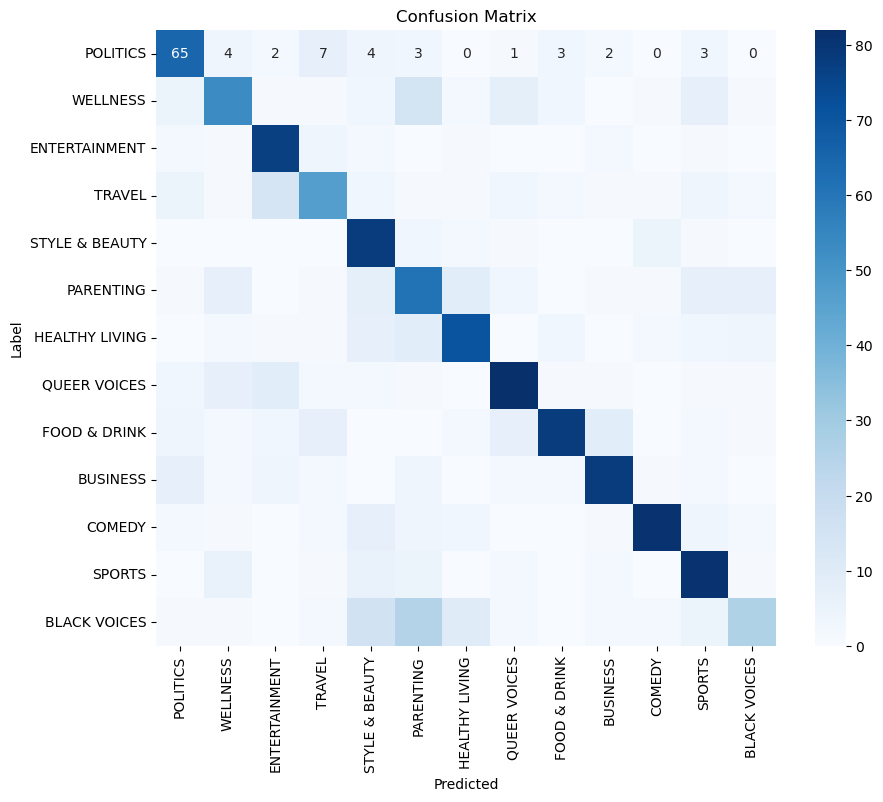

In [84]:
from sklearn.ensemble import RandomForestClassifier

rfc= RandomForestClassifier()
rfc.fit(x_train,y_train)

pred= rfc.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Multinomial NB

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.58      0.67      0.62        94
      WELLNESS       0.62      0.46      0.53       100
 ENTERTAINMENT       0.69      0.80      0.74        90
        TRAVEL       0.60      0.42      0.50        85
STYLE & BEAUTY       0.78      0.66      0.71        90
     PARENTING       0.63      0.31      0.42       106
HEALTHY LIVING       0.44      0.84      0.58       103
  QUEER VOICES       0.69      0.72      0.71       110
  FOOD & DRINK       0.92      0.58      0.71       115
      BUSINESS       0.82      0.72      0.77       104
        COMEDY       0.73      0.76      0.74       107
        SPORTS       0.90      0.62      0.73       104
  BLACK VOICES       0.36      0.65      0.46        92

      accuracy                           0.63      1300
     macro avg       0.67      0.63      0.63      1300
  weighted avg       0.68      0.63      0.64      1300

Accuracy :  63.230769

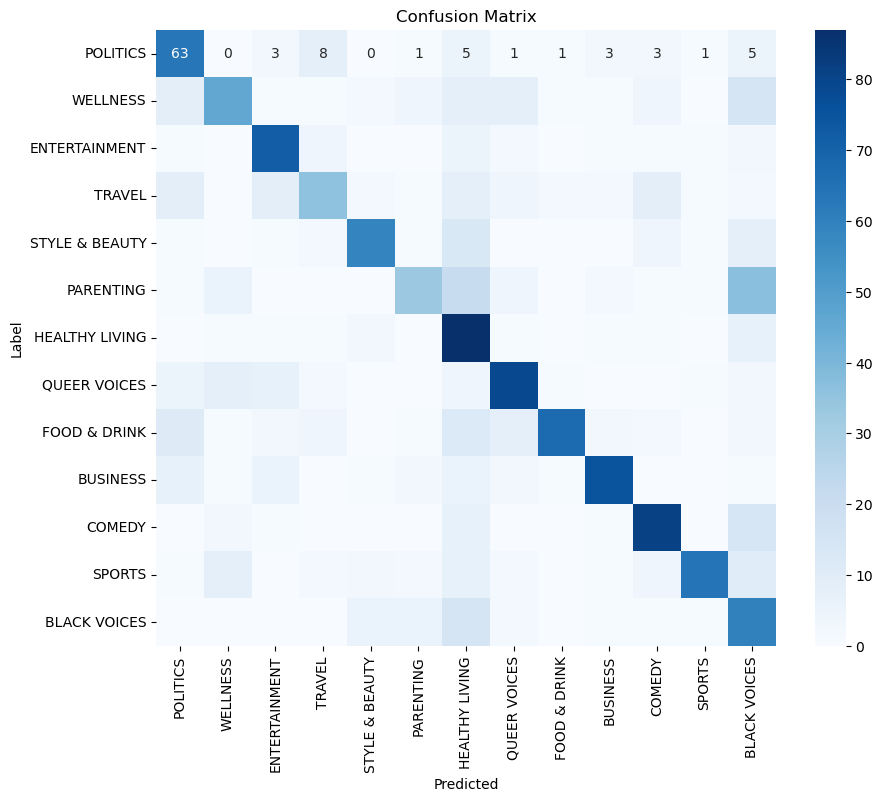

In [79]:
from sklearn.naive_bayes import MultinomialNB

mnb= MultinomialNB()
mnb.fit(x_train,y_train)

pred= mnb.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Logistic Regression

Classification Report:
                precision    recall  f1-score   support

      POLITICS       0.67      0.66      0.66        94
      WELLNESS       0.53      0.53      0.53       100
 ENTERTAINMENT       0.78      0.68      0.73        90
        TRAVEL       0.44      0.59      0.51        85
STYLE & BEAUTY       0.64      0.76      0.69        90
     PARENTING       0.46      0.42      0.44       106
HEALTHY LIVING       0.64      0.72      0.68       103
  QUEER VOICES       0.73      0.76      0.75       110
  FOOD & DRINK       0.86      0.59      0.70       115
      BUSINESS       0.82      0.72      0.77       104
        COMEDY       0.76      0.76      0.76       107
        SPORTS       0.78      0.68      0.73       104
  BLACK VOICES       0.39      0.49      0.43        92

      accuracy                           0.64      1300
     macro avg       0.65      0.64      0.64      1300
  weighted avg       0.66      0.64      0.65      1300

Accuracy: 64.384615384

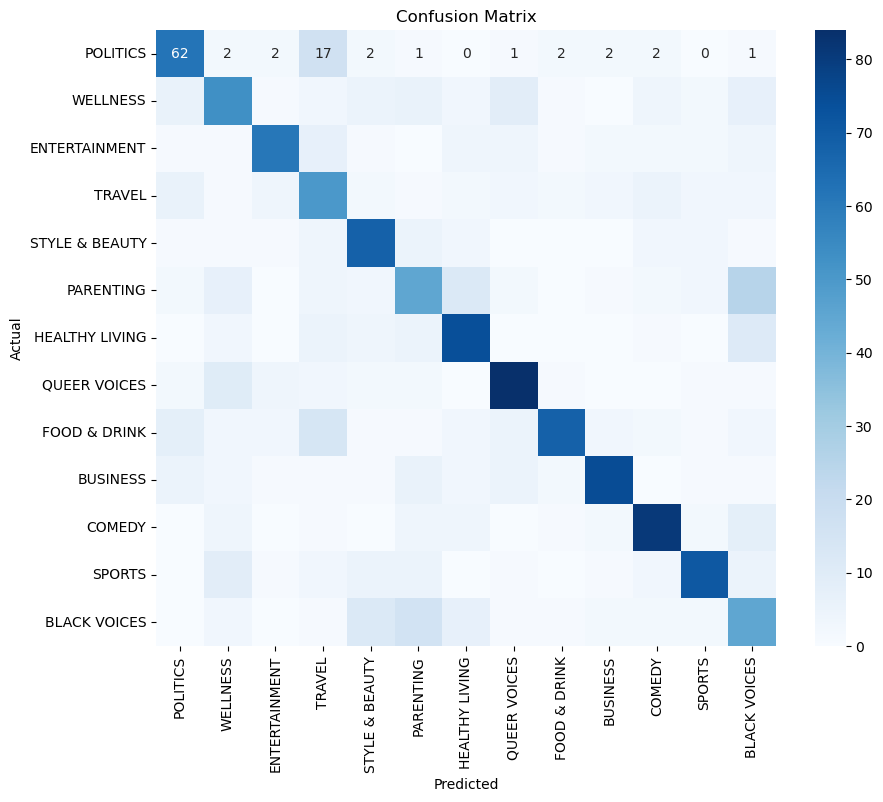

In [80]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression Model
lr = LogisticRegression()
lr.fit(x_train, y_train)  # Assuming x_train is a sparse matrix

# Predictions
pred = lr.predict(x_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, pred, zero_division=1, target_names=dataset['category'].unique()))

# Accuracy, Precision, Recall
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Confusion Matrix
cmx = confusion_matrix(y_test, pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### Support Vector Machines (SVM)

Accuracy: 64.76923076923077
Precision score: 67.2419563051055
Recall score: 64.76923076923077
Classification Report:
              precision    recall  f1-score   support

           0       0.63      0.66      0.64        94
           1       0.52      0.54      0.53       100
           2       0.79      0.72      0.76        90
           3       0.44      0.59      0.50        85
           4       0.72      0.71      0.72        90
           5       0.47      0.49      0.48       106
           6       0.65      0.69      0.67       103
           7       0.71      0.74      0.72       110
           8       0.89      0.57      0.69       115
           9       0.82      0.69      0.75       104
          10       0.81      0.78      0.79       107
          11       0.80      0.69      0.74       104
          12       0.40      0.55      0.47        92

    accuracy                           0.65      1300
   macro avg       0.67      0.65      0.65      1300
weighted avg     

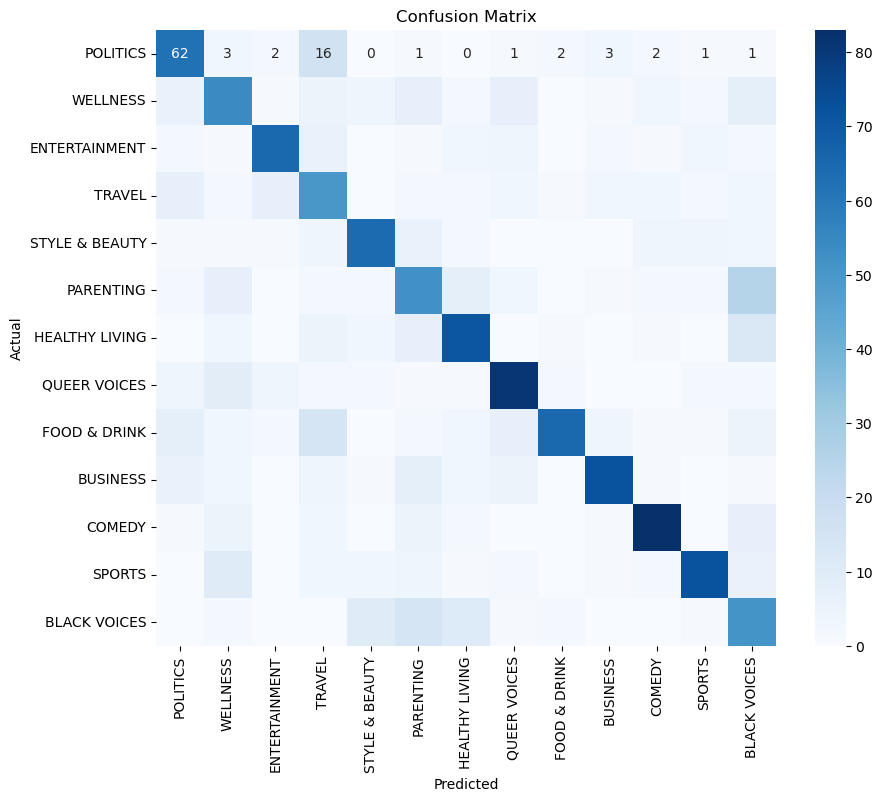

In [81]:
from sklearn.svm import SVC

# Create SVM model
svm = SVC(kernel='linear')  # You can choose different kernels such as 'linear', 'poly', 'rbf', etc.

# Train the model
svm.fit(x_train, y_train)  # Assuming x_train is your feature matrix and y_train is your target vector

# predictions on the test
pred = svm.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generate confusion matrix
cmx = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


### k-Nearest Neighbors (KNN)

Accuracy: 52.07692307692307
Precision score: 55.54369167598219
Recall score: 52.07692307692307
Classification Report:
              precision    recall  f1-score   support

           0       0.37      0.74      0.50        94
           1       0.35      0.48      0.40       100
           2       0.54      0.73      0.62        90
           3       0.54      0.51      0.52        85
           4       0.54      0.60      0.57        90
           5       0.33      0.28      0.31       106
           6       0.52      0.49      0.50       103
           7       0.65      0.55      0.59       110
           8       0.74      0.47      0.57       115
           9       0.76      0.54      0.63       104
          10       0.80      0.62      0.70       107
          11       0.67      0.50      0.57       104
          12       0.33      0.30      0.31        92

    accuracy                           0.52      1300
   macro avg       0.55      0.52      0.52      1300
weighted avg    

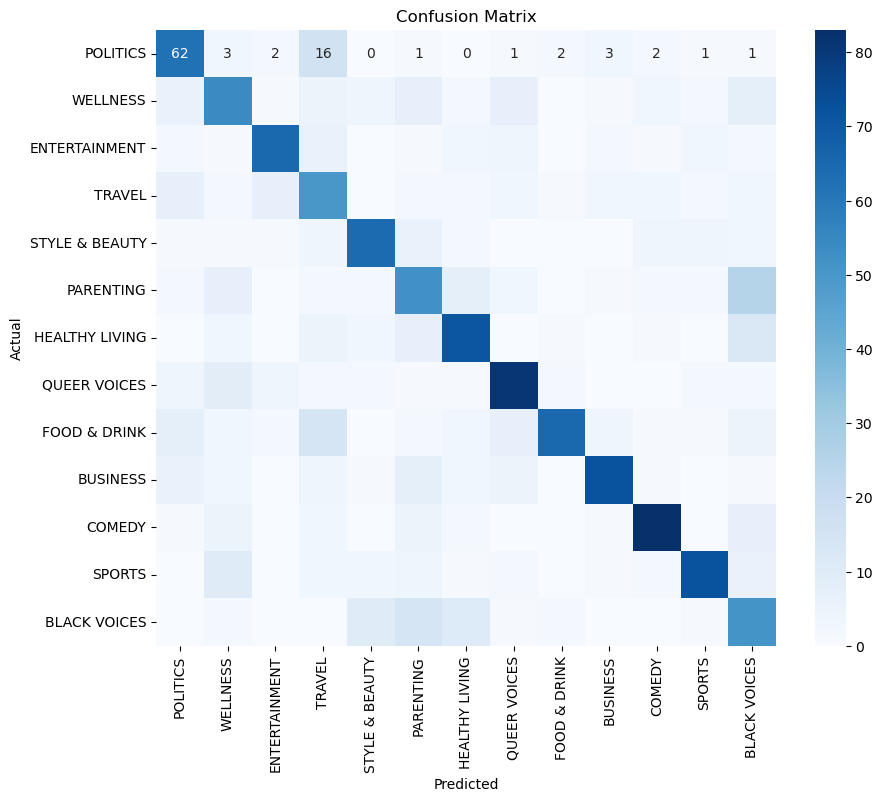

In [83]:
from sklearn.neighbors import KNeighborsClassifier

# KNN model
knn = KNeighborsClassifier(n_neighbors=5)  # You can choose the number of neighbors (k) as per your choice

# Training the model
knn.fit(x_train, y_train)

# predictions on the test
pred = knn.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generating confusion matrix
cm = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


# 2. TF-IDF Vectorizer

In [87]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf= TfidfVectorizer()
label= LabelEncoder()

x= tfidf.fit_transform(dataset["News"])
y= label.fit_transform(dataset["category"])
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=0)

### Random Forest Classifier

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.64      0.63      0.63        94
      WELLNESS       0.54      0.50      0.52       100
 ENTERTAINMENT       0.75      0.77      0.76        90
        TRAVEL       0.45      0.59      0.51        85
STYLE & BEAUTY       0.64      0.82      0.72        90
     PARENTING       0.48      0.53      0.50       106
HEALTHY LIVING       0.72      0.71      0.71       103
  QUEER VOICES       0.67      0.79      0.73       110
  FOOD & DRINK       0.89      0.56      0.68       115
      BUSINESS       0.77      0.64      0.70       104
        COMEDY       0.75      0.75      0.75       107
        SPORTS       0.70      0.68      0.69       104
  BLACK VOICES       0.48      0.42      0.45        92

      accuracy                           0.65      1300
     macro avg       0.65      0.65      0.64      1300
  weighted avg       0.66      0.65      0.65      1300

Accuracy :  64.538461

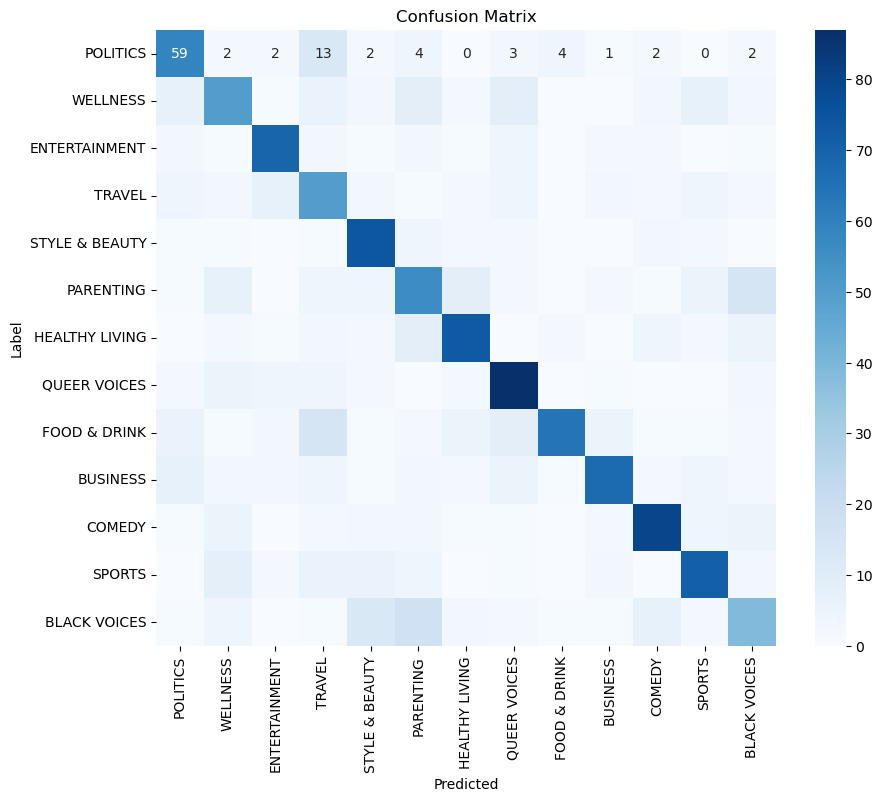

In [88]:
from sklearn.ensemble import RandomForestClassifier

rfc= RandomForestClassifier()
rfc.fit(x_train,y_train)

pred= rfc.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Multinomial NB

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.59      0.68      0.63        94
      WELLNESS       0.64      0.56      0.60       100
 ENTERTAINMENT       0.73      0.82      0.77        90
        TRAVEL       0.65      0.53      0.58        85
STYLE & BEAUTY       0.78      0.74      0.76        90
     PARENTING       0.62      0.37      0.46       106
HEALTHY LIVING       0.51      0.83      0.63       103
  QUEER VOICES       0.75      0.75      0.75       110
  FOOD & DRINK       0.92      0.63      0.75       115
      BUSINESS       0.85      0.77      0.81       104
        COMEDY       0.74      0.79      0.77       107
        SPORTS       0.87      0.64      0.74       104
  BLACK VOICES       0.39      0.60      0.47        92

      accuracy                           0.67      1300
     macro avg       0.70      0.67      0.67      1300
  weighted avg       0.70      0.67      0.67      1300

Accuracy :  67.153846

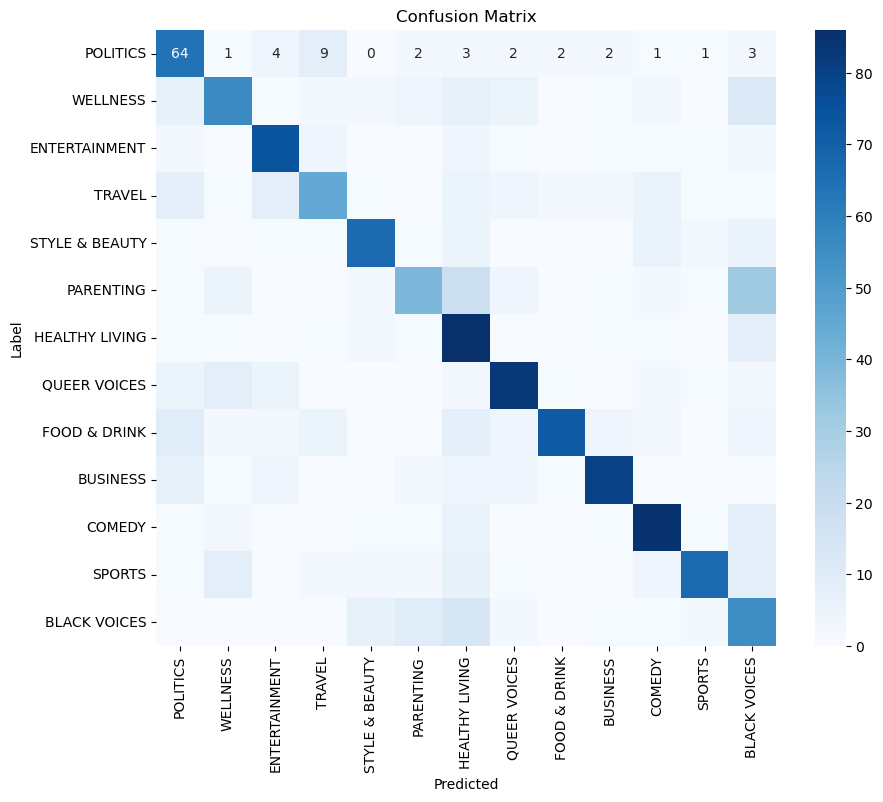

In [89]:
from sklearn.naive_bayes import MultinomialNB

mnb= MultinomialNB()
mnb.fit(x_train,y_train)

pred= mnb.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Logistic Regression

Classification Report:
                precision    recall  f1-score   support

      POLITICS       0.65      0.70      0.68        94
      WELLNESS       0.58      0.56      0.57       100
 ENTERTAINMENT       0.82      0.78      0.80        90
        TRAVEL       0.53      0.64      0.58        85
STYLE & BEAUTY       0.72      0.81      0.76        90
     PARENTING       0.49      0.48      0.49       106
HEALTHY LIVING       0.69      0.74      0.71       103
  QUEER VOICES       0.72      0.80      0.76       110
  FOOD & DRINK       0.93      0.67      0.78       115
      BUSINESS       0.86      0.76      0.81       104
        COMEDY       0.79      0.79      0.79       107
        SPORTS       0.87      0.73      0.80       104
  BLACK VOICES       0.46      0.55      0.50        92

      accuracy                           0.69      1300
     macro avg       0.70      0.69      0.69      1300
  weighted avg       0.71      0.69      0.70      1300

Accuracy: 69.384615384

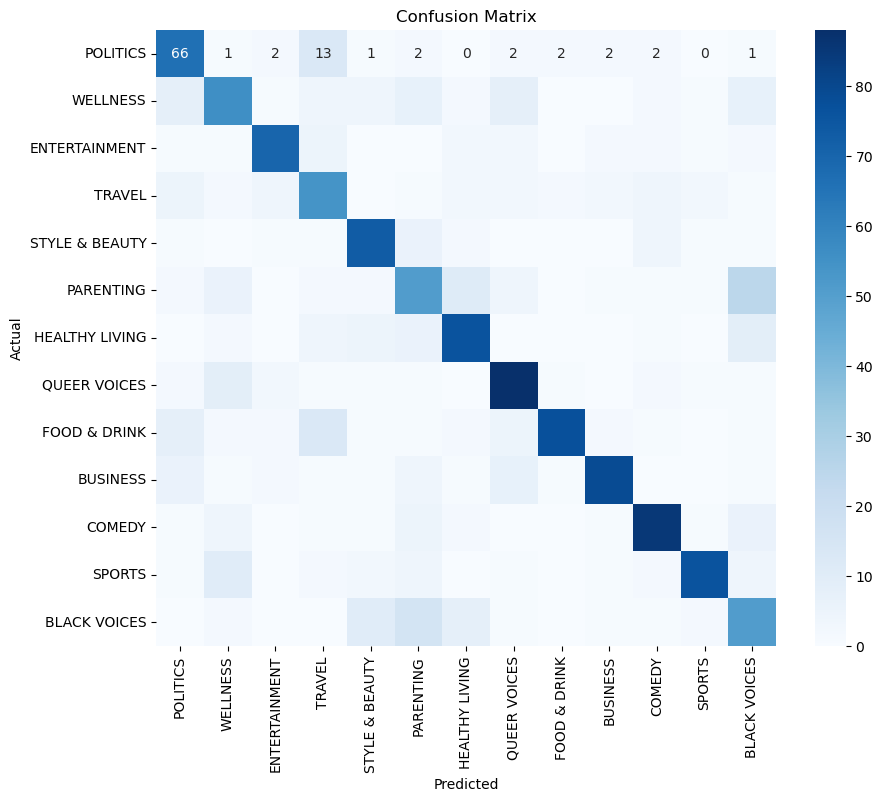

In [90]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression Model
lr = LogisticRegression()
lr.fit(x_train, y_train)  # Assuming x_train is a sparse matrix

# Predictions
pred = lr.predict(x_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, pred, zero_division=1, target_names=dataset['category'].unique()))

# Accuracy, Precision, Recall
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Confusion Matrix
cmx = confusion_matrix(y_test, pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### Support Vector Machines (SVM)

Accuracy: 68.46153846153847
Precision score: 70.43538334306272
Recall score: 68.46153846153847
Classification Report:
              precision    recall  f1-score   support

           0       0.64      0.66      0.65        94
           1       0.55      0.61      0.58       100
           2       0.84      0.73      0.78        90
           3       0.53      0.66      0.59        85
           4       0.72      0.76      0.74        90
           5       0.49      0.52      0.50       106
           6       0.71      0.69      0.70       103
           7       0.72      0.79      0.76       110
           8       0.91      0.64      0.76       115
           9       0.84      0.73      0.78       104
          10       0.83      0.81      0.82       107
          11       0.84      0.70      0.76       104
          12       0.47      0.59      0.52        92

    accuracy                           0.68      1300
   macro avg       0.70      0.68      0.69      1300
weighted avg    

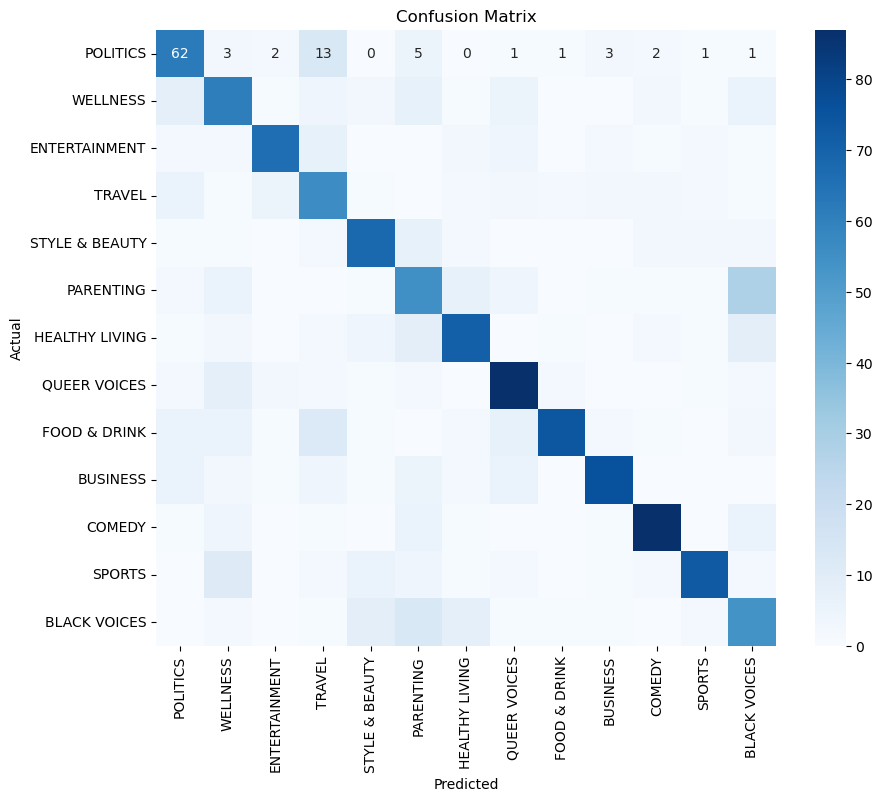

In [91]:
from sklearn.svm import SVC

# Create SVM model
svm = SVC(kernel='linear')  # You can choose different kernels such as 'linear', 'poly', 'rbf', etc.

# Train the model
svm.fit(x_train, y_train)  # Assuming x_train is your feature matrix and y_train is your target vector

# predictions on the test
pred = svm.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generate confusion matrix
cmx = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


### k-Nearest Neighbors (KNN)

Accuracy: 56.769230769230774
Precision score: 58.31001873605718
Recall score: 56.769230769230774
Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.73      0.56        94
           1       0.42      0.56      0.48       100
           2       0.52      0.74      0.61        90
           3       0.50      0.53      0.51        85
           4       0.68      0.71      0.70        90
           5       0.44      0.38      0.41       106
           6       0.57      0.48      0.52       103
           7       0.63      0.57      0.60       110
           8       0.71      0.47      0.57       115
           9       0.75      0.68      0.71       104
          10       0.77      0.68      0.72       107
          11       0.69      0.57      0.62       104
          12       0.37      0.30      0.34        92

    accuracy                           0.57      1300
   macro avg       0.58      0.57      0.57      1300
weighted avg  

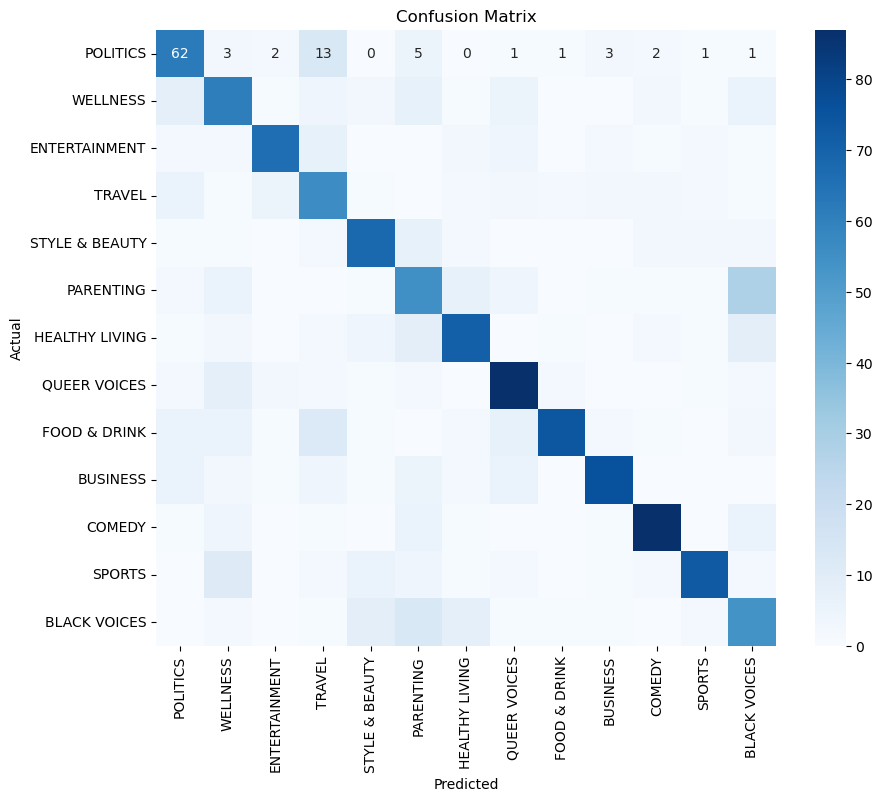

In [92]:
from sklearn.neighbors import KNeighborsClassifier

# KNN model
knn = KNeighborsClassifier(n_neighbors=5)  # You can choose the number of neighbors (k) as per your choice

# Training the model
knn.fit(x_train, y_train)

# predictions on the test
pred = knn.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generating confusion matrix
cm = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


# 3. Count Vectorizer

In [95]:
from sklearn.feature_extraction.text import CountVectorizer

cv= CountVectorizer()
label= LabelEncoder()

x= cv.fit_transform(dataset["News"])
y= label.fit_transform(dataset["category"])
x_train,x_test,y_train,y_test= train_test_split(x,y,test_size=0.20,random_state=0)

### Random Forest Classifier

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.61      0.61      0.61        94
      WELLNESS       0.55      0.46      0.50       100
 ENTERTAINMENT       0.70      0.78      0.74        90
        TRAVEL       0.41      0.64      0.50        85
STYLE & BEAUTY       0.62      0.78      0.69        90
     PARENTING       0.40      0.51      0.45       106
HEALTHY LIVING       0.67      0.69      0.68       103
  QUEER VOICES       0.70      0.75      0.72       110
  FOOD & DRINK       0.97      0.53      0.69       115
      BUSINESS       0.76      0.68      0.72       104
        COMEDY       0.77      0.68      0.72       107
        SPORTS       0.62      0.71      0.66       104
  BLACK VOICES       0.43      0.24      0.31        92

      accuracy                           0.62      1300
     macro avg       0.63      0.62      0.61      1300
  weighted avg       0.64      0.62      0.62      1300

Accuracy :  61.923076

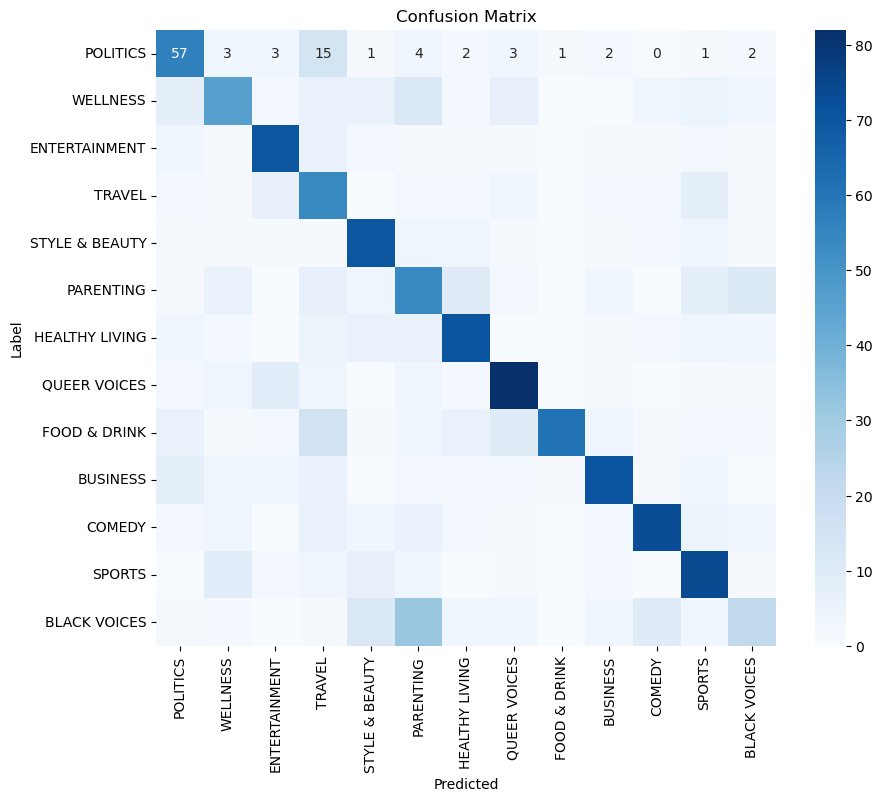

In [94]:
from sklearn.ensemble import RandomForestClassifier

rfc= RandomForestClassifier()
rfc.fit(x_train,y_train)

pred= rfc.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Multinomial NB

Classification Report :                 precision    recall  f1-score   support

      POLITICS       0.65      0.64      0.65        94
      WELLNESS       0.67      0.58      0.62       100
 ENTERTAINMENT       0.80      0.78      0.79        90
        TRAVEL       0.59      0.51      0.54        85
STYLE & BEAUTY       0.76      0.72      0.74        90
     PARENTING       0.57      0.34      0.43       106
HEALTHY LIVING       0.50      0.82      0.62       103
  QUEER VOICES       0.70      0.79      0.74       110
  FOOD & DRINK       0.88      0.67      0.76       115
      BUSINESS       0.85      0.77      0.81       104
        COMEDY       0.72      0.79      0.75       107
        SPORTS       0.84      0.60      0.70       104
  BLACK VOICES       0.38      0.62      0.47        92

      accuracy                           0.66      1300
     macro avg       0.69      0.66      0.66      1300
  weighted avg       0.69      0.66      0.67      1300

Accuracy :  66.384615

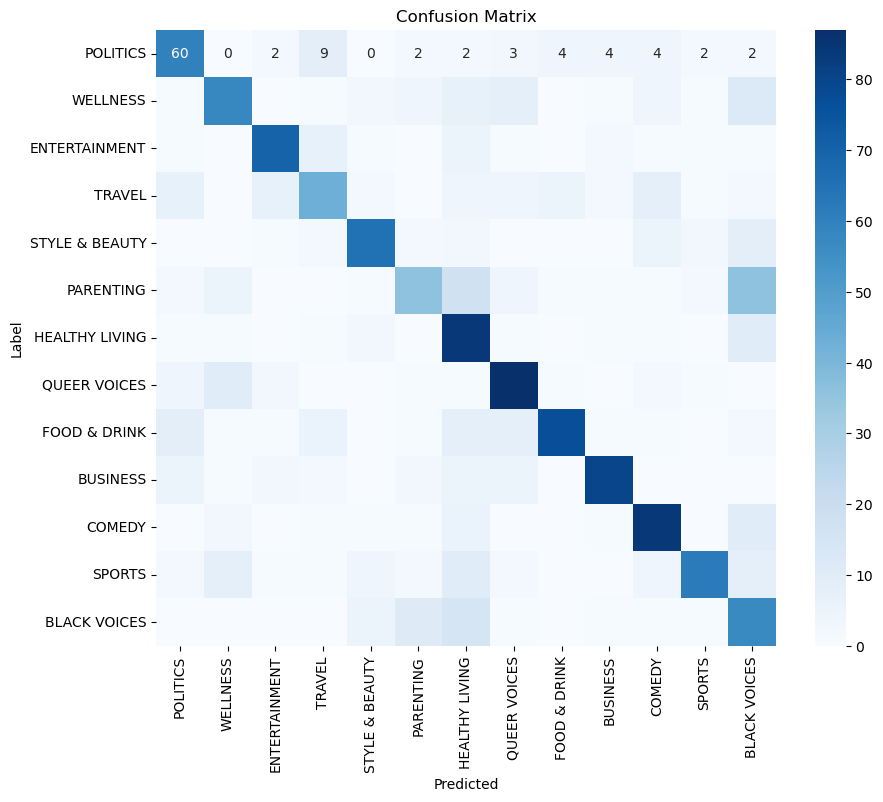

In [96]:
from sklearn.naive_bayes import MultinomialNB

mnb= MultinomialNB()
mnb.fit(x_train,y_train)

pred= mnb.predict(x_test)

print("Classification Report :",classification_report(y_test,pred,zero_division=1,target_names=dataset['category'].unique()))
print ("Accuracy : ", accuracy_score(y_test, pred)*100)
print("Precision score :",precision_score(y_test,pred,average="weighted")*100)
print("Recall score :",recall_score(y_test,pred,average="weighted")*100)

cmx = confusion_matrix(y_test, pred)

plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Label")
plt.show()

### Logistic Regression

Classification Report:
                precision    recall  f1-score   support

      POLITICS       0.62      0.68      0.65        94
      WELLNESS       0.56      0.58      0.57       100
 ENTERTAINMENT       0.80      0.78      0.79        90
        TRAVEL       0.48      0.59      0.53        85
STYLE & BEAUTY       0.65      0.67      0.66        90
     PARENTING       0.47      0.54      0.50       106
HEALTHY LIVING       0.68      0.68      0.68       103
  QUEER VOICES       0.75      0.75      0.75       110
  FOOD & DRINK       0.81      0.66      0.73       115
      BUSINESS       0.83      0.71      0.77       104
        COMEDY       0.86      0.78      0.81       107
        SPORTS       0.71      0.74      0.73       104
  BLACK VOICES       0.51      0.48      0.49        92

      accuracy                           0.67      1300
     macro avg       0.67      0.66      0.67      1300
  weighted avg       0.68      0.67      0.67      1300

Accuracy: 66.615384615

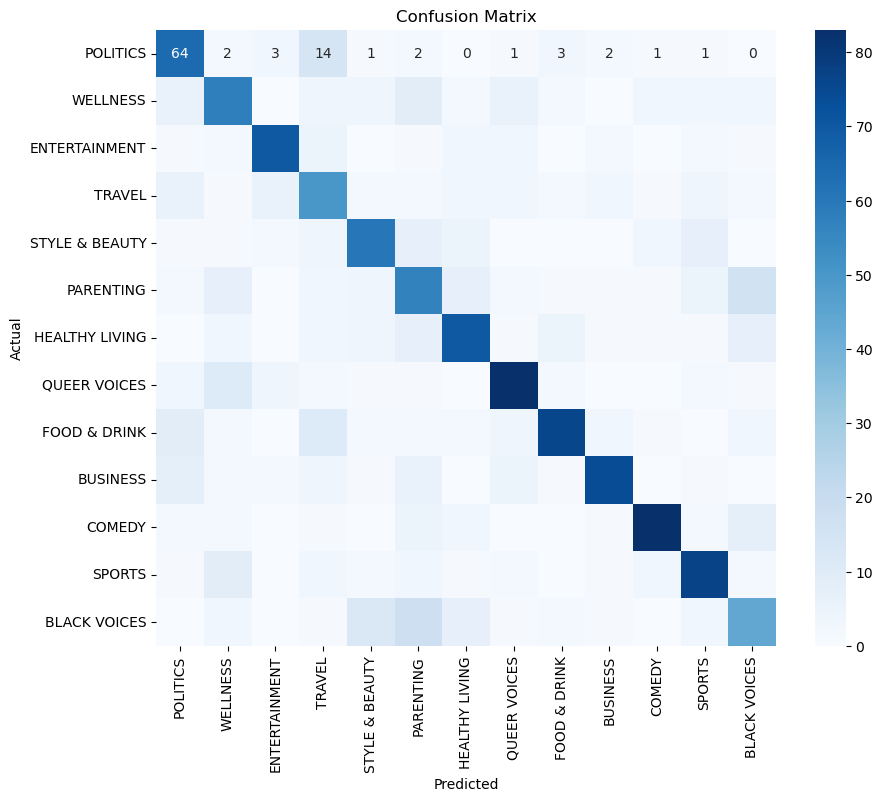

In [97]:
from sklearn.linear_model import LogisticRegression

# Logistic Regression Model
lr = LogisticRegression()
lr.fit(x_train, y_train)  # Assuming x_train is a sparse matrix

# Predictions
pred = lr.predict(x_test)

# Classification Report
print("Classification Report:")
print(classification_report(y_test, pred, zero_division=1, target_names=dataset['category'].unique()))

# Accuracy, Precision, Recall
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Confusion Matrix
cmx = confusion_matrix(y_test, pred)
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

### Support Vector Machines (SVM)

Accuracy: 64.3076923076923
Precision score: 66.04592902149062
Recall score: 64.3076923076923
Classification Report:
              precision    recall  f1-score   support

           0       0.53      0.67      0.59        94
           1       0.50      0.55      0.53       100
           2       0.73      0.73      0.73        90
           3       0.46      0.55      0.50        85
           4       0.69      0.68      0.68        90
           5       0.43      0.57      0.49       106
           6       0.72      0.68      0.70       103
           7       0.76      0.72      0.74       110
           8       0.81      0.65      0.72       115
           9       0.81      0.68      0.74       104
          10       0.85      0.71      0.78       107
          11       0.70      0.73      0.72       104
          12       0.51      0.40      0.45        92

    accuracy                           0.64      1300
   macro avg       0.65      0.64      0.64      1300
weighted avg      

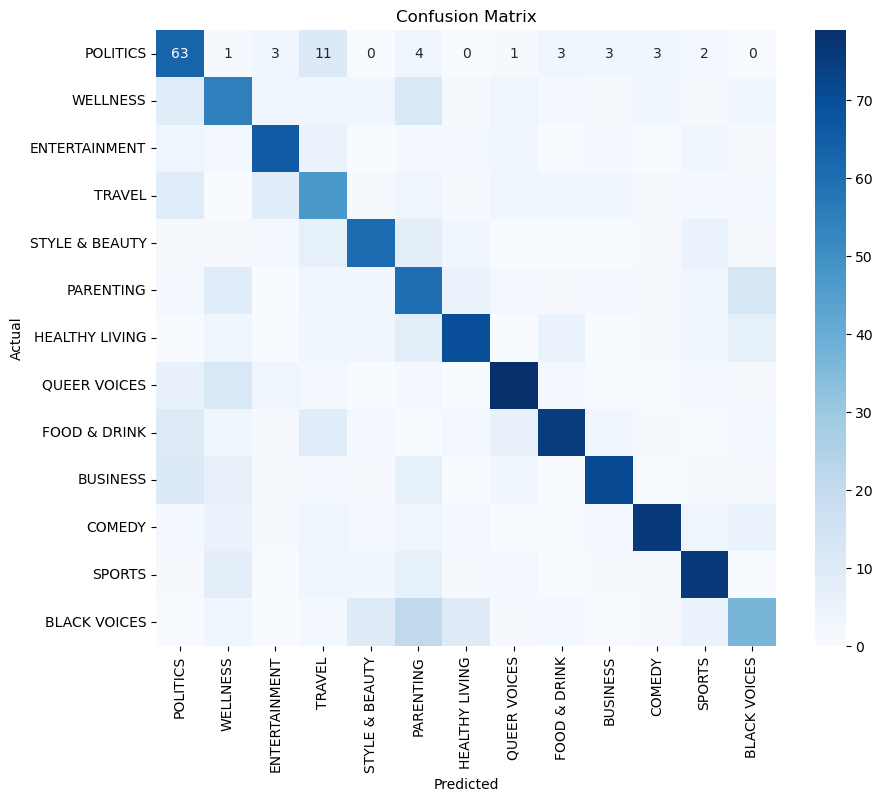

In [98]:
from sklearn.svm import SVC

# Create SVM model
svm = SVC(kernel='linear')  # You can choose different kernels such as 'linear', 'poly', 'rbf', etc.

# Train the model
svm.fit(x_train, y_train)  # Assuming x_train is your feature matrix and y_train is your target vector

# predictions on the test
pred = svm.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generate confusion matrix
cmx = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()


### k-Nearest Neighbors (KNN)

C:\Users\acer\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\acer\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\acer\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

C:\Users\acer\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parame

Accuracy: 21.615384615384613
Precision score: 51.19100526893089
Recall score: 21.615384615384613
Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.19      0.27        94
           1       0.29      0.14      0.19       100
           2       0.40      0.58      0.47        90
           3       0.23      0.14      0.17        85
           4       0.23      0.32      0.27        90
           5       0.13      0.17      0.15       106
           6       1.00      0.02      0.04       103
           7       0.93      0.13      0.22       110
           8       1.00      0.02      0.03       115
           9       0.78      0.20      0.32       104
          10       0.82      0.08      0.15       107
          11       0.13      0.87      0.22       104
          12       0.00      0.00      0.00        92

    accuracy                           0.22      1300
   macro avg       0.49      0.22      0.19      1300
weighted avg  

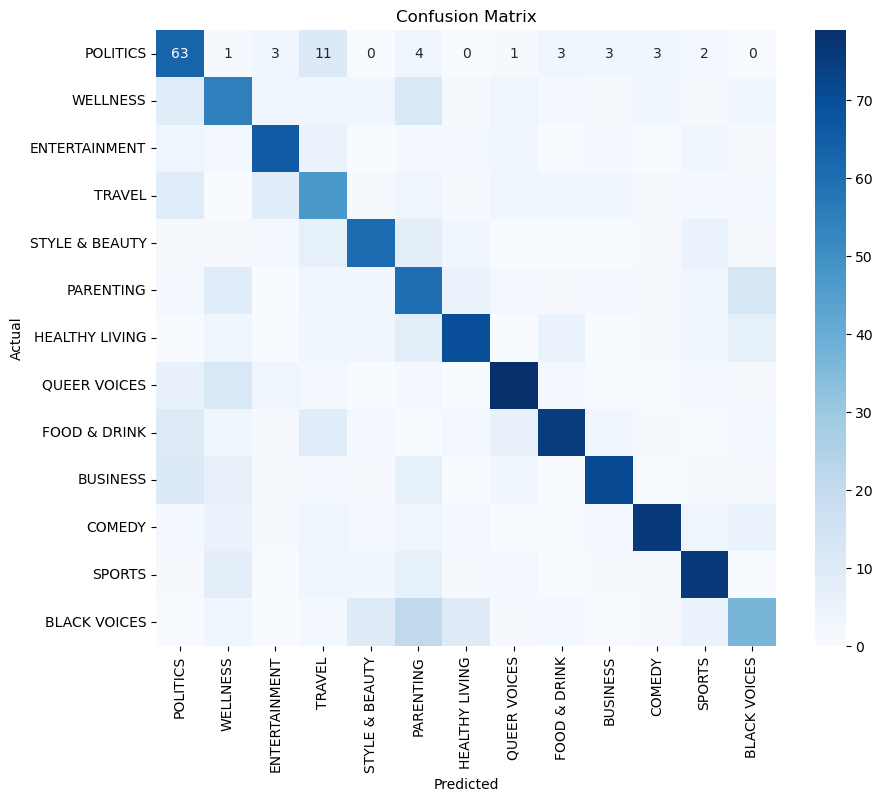

In [99]:
from sklearn.neighbors import KNeighborsClassifier

# KNN model
knn = KNeighborsClassifier(n_neighbors=5)  # You can choose the number of neighbors (k) as per your choice

# Training the model
knn.fit(x_train, y_train)

# predictions on the test
pred = knn.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, pred) * 100
precision = precision_score(y_test, pred, average="weighted") * 100
recall = recall_score(y_test, pred, average="weighted") * 100
print("Accuracy:", accuracy)
print("Precision score:", precision)
print("Recall score:", recall)

# Print classification report
print("Classification Report:")
print(classification_report(y_test, pred))

# Generating confusion matrix
cm = confusion_matrix(y_test, pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cmx, annot=True, fmt="d", cmap="Blues", xticklabels=dataset['category'].unique(), yticklabels=dataset['category'].unique())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()